<a href="https://colab.research.google.com/github/abhyudaya29/image/blob/main/_content_lot_jpeg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

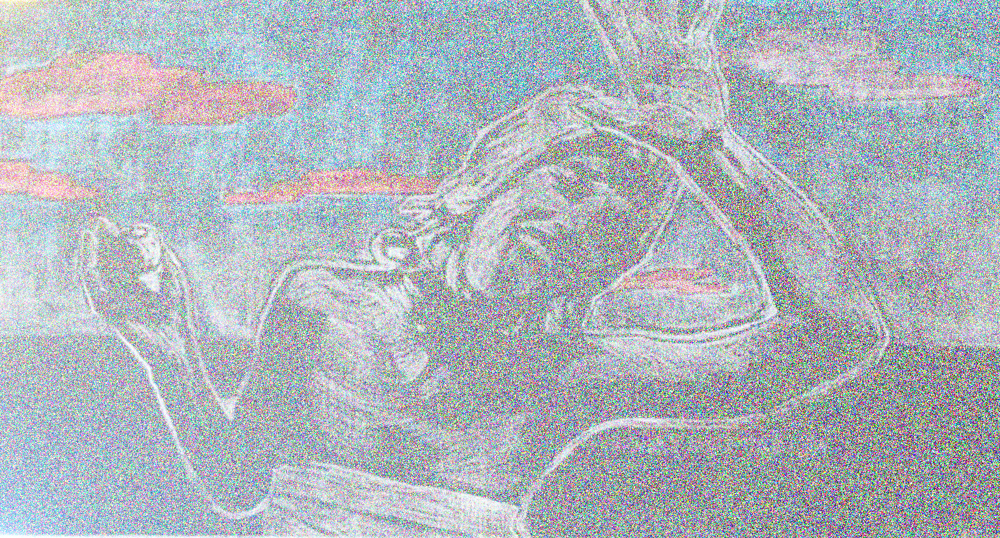

In [4]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

def add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, noise)
    return noisy_image

# Load a colored image
image = cv2.imread("/content/lot.jpeg")

# Add Gaussian noise to the image
noisy_image = add_gaussian_noise(image)

# Display the noisy image
cv2_imshow(noisy_image)


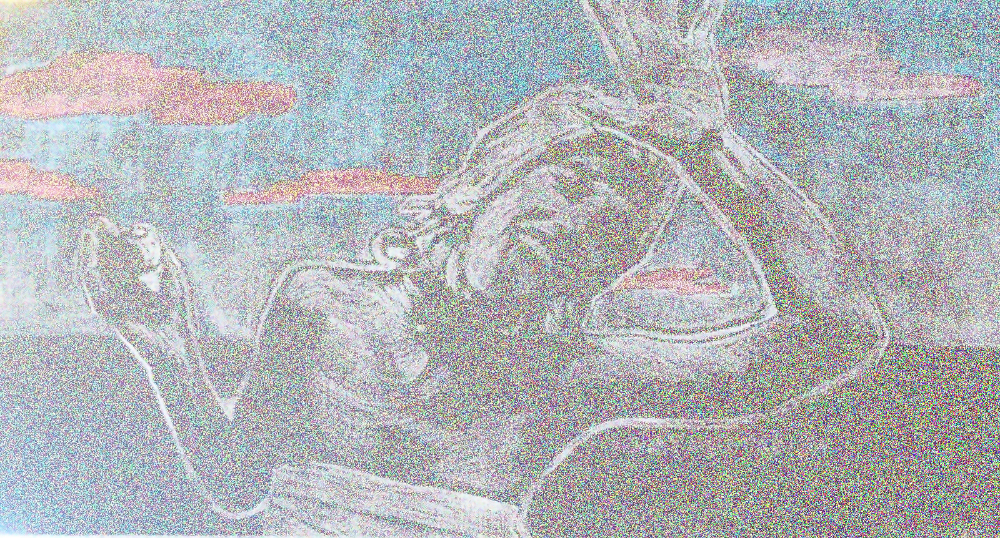

In [5]:
def denoise_non_local_means(image, h=10, h_search=30, window_size=5):
    denoised_image = cv2.fastNlMeansDenoisingColored(
        image, None, h, h_search, window_size, window_size
    )
    return denoised_image

# Denoise the noisy image using non-local means
denoised_image = denoise_non_local_means(noisy_image)

# Display the denoised image
cv2_imshow(denoised_image)

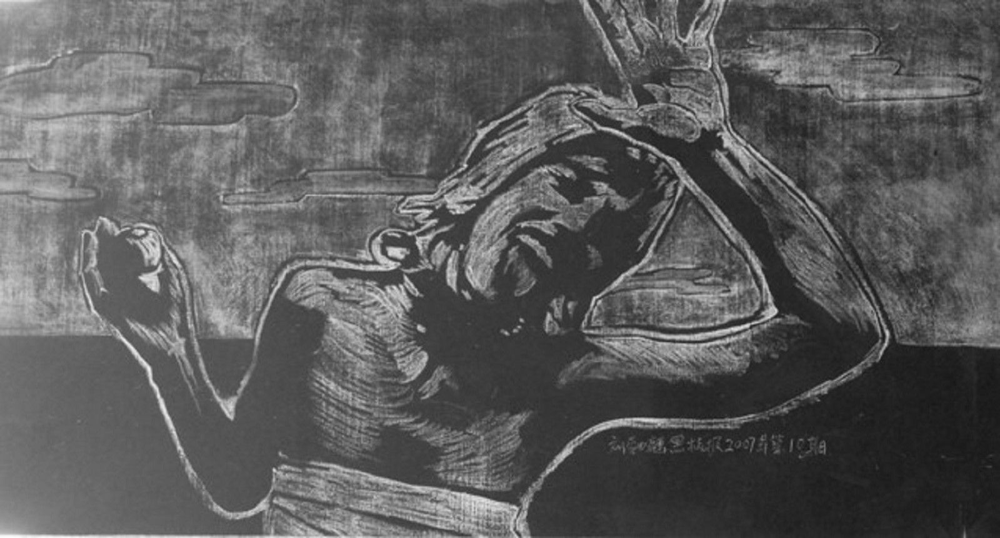

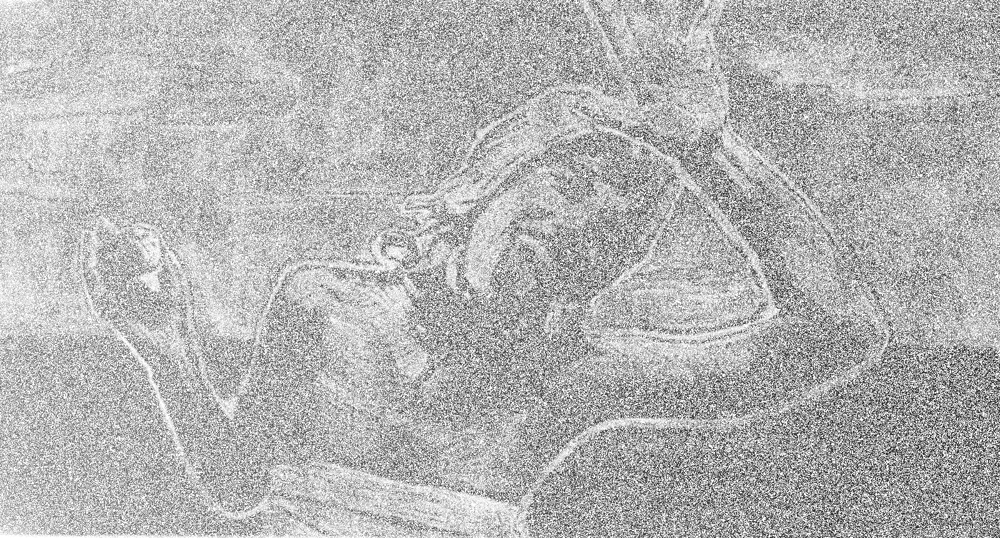

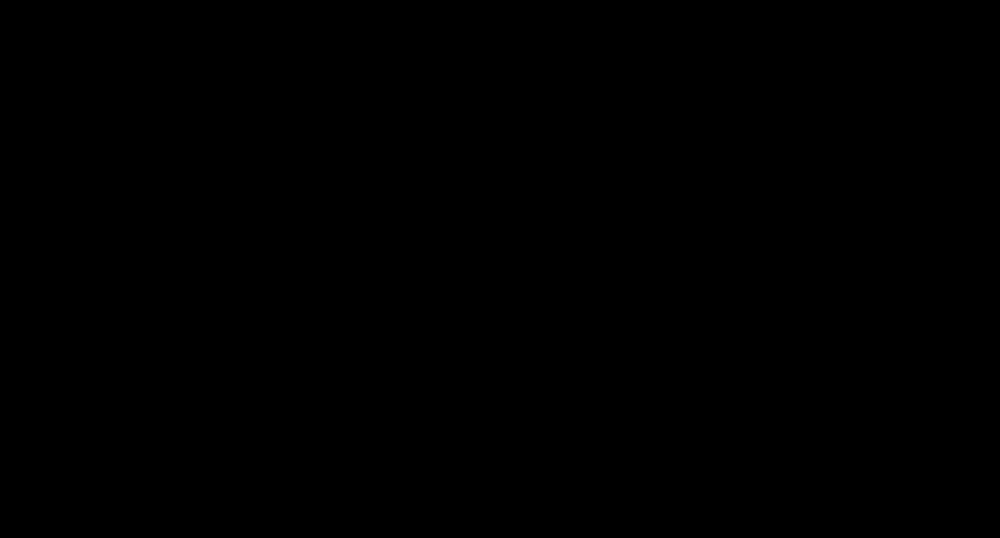

In [9]:
import numpy as np
import cv2
from scipy.signal import convolve2d
from google.colab.patches import cv2_imshow

def add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, noise)
    return noisy_image

def wiener_filter(noisy_image, kernel, noise_var):
    noisy_fft = np.fft.fft2(noisy_image)
    kernel_fft = np.fft.fft2(kernel, s=noisy_image.shape)

    restoration_fft = np.conj(kernel_fft) / (np.abs(kernel_fft) ** 2 + noise_var)
    restored_image_fft = noisy_fft * restoration_fft
    restored_image = np.abs(np.fft.ifft2(restored_image_fft))

    return restored_image.astype(np.uint8)

# Load a grayscale image
image = cv2.imread("/content/lot.jpeg", cv2.IMREAD_GRAYSCALE)

# Add Gaussian noise to the image
noisy_image = add_gaussian_noise(image)

# Define a Wiener filter kernel (e.g., Gaussian kernel)
kernel_size = 5
sigma = 1.5
kernel = cv2.getGaussianKernel(kernel_size, sigma)
kernel = np.outer(kernel, kernel)

# Estimate noise variance (assuming additive Gaussian noise)
noise_var = np.var(noisy_image - image)

# Apply the Wiener filter
restored_image = wiener_filter(noisy_image, kernel, noise_var)

# Display the original, noisy, and restored images
cv2_imshow(image)
cv2_imshow(noisy_image)
cv2_imshow(restored_image)
